Lucie MOREAU, Patricia SANCHEZ-ROMERO

---

# Introduction



Glaucoma, a leading cause of irreversible blindness worldwide, encompasses a range of disorders characterized by optic nerve damage. Among these, Primary Open-Angle Glaucoma (POAG) is a significant subset, marked by progressive visual field loss. It is distinguished by an open anterior chamber angle and elevated intraocular pressure (IOP) without any underlying disease. When an identifiable cause for the elevated IOP is present, the condition is classified as secondary glaucoma.

The lamina cribrosa plays a critical role in the optic nerve head, providing nutrition to the retinal nerve fiber bundles (RNFBs) through its connective tissue structure. Elevated IOP can cause deformation of the lamina cribrosa pores, disrupting the axonal arrangement, oxygenation, and blood flow necessary for maintaining optic nerve function. Understanding these changes is pivotal for advancing the diagnosis and treatment of POAG. However, the state of the art in this area remains limited, with few articles and recent observations shedding light on these processes.

To address this challenge, we utilized a Flood Illumination Adaptive Optics (FIAO) camera for imaging the optic nerve head. This imaging technique offers high-resolution images with a flashed flood source at 850 nm, capturing a 4° × 4° retinal area (equivalent to 1.2 mm × 1.2 mm) with a lateral resolution of 2 µm. Imaging is conducted in a dark room to facilitate high-quality capture without the need for pharmacological pupil dilation.

The figure below shows a greyscale and a color image of the FIAO screening, where structures are indicated with arrows. In our image (point out), we highlight where blood vessels and relevant pores are, the latter being the structures of interest.

## Bibliography

* [ Zwillinger, S et al. “In vivo characterization of lamina cribrosa pore
morphology in primary open-angle glaucoma.” Journal francais
 d'ophtalmologie vol. 39,3 (2016): 265-71](https://www.sciencedirect.com/science/article/abs/pii/S0181551216000589)


* [Park, Sung Chul & Ritch, Robert. (2011). High resolution in vivo imaging of the lamina cribrosa. Saudi journal of ophthalmology : official journal of the Saudi Ophthalmological Society. 25. 363-72. 10.1016/j.sjopt.2011.07.007. ](https://www.researchgate.net/publication/255987668_High_resolution_in_vivo_imaging_of_the_lamina_cribrosa)

* [Nadler, Z  et al. "Automated lamina cribrosa microstructural segmentation in optical coherence tomography scans of healthy and glaucomatous eyes," Biomed. Opt. Express 4, 2596-2608 (2013)](https://opg.optica.org/boe/fulltext.cfm?uri=boe-4-11-2596&id=269993)


## Importing libraries

In [1]:
!pip install scikit-learn


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\lu6mo\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
%matplotlib inline
# Classic Libraries
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

import numpy as np
import pandas as pd
import os, sys, tarfile, io, itertools
import random

# Image libraries
from PIL import Image
import cv2
import scipy

# Specific libraries
from skimage import morphology as MM
from sklearn import metrics as MM2
from skimage import exposure
from skimage import filters
from skimage.filters import try_all_threshold
from skimage.util import img_as_ubyte
from skimage import feature
from skimage import morphology as MM
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix

ModuleNotFoundError: No module named 'sklearn'

In [ ]:
base_working_dir = os.getcwd()
os.makedirs(base_working_dir, exist_ok=True)

raw_image_dir = os.path.join(base_working_dir, "Images")
mask_dir = os.path.join(base_working_dir, "Ground_truth")
output_dir = os.path.join(base_working_dir, "Results")

if not os.path.exists(output_dir):
    os.mkdir(output_dir)

## Loading Dataset


For our study, we employed a database consisting of 10 grayscale images and their associated ground truth annotations. The database exhibits variations in contrast, morphology, the presence of black rectangles, noise, and image centering. The ground truth, provided as binary MATLAB files, was hand-drawn by ophthalmologists.

In [ ]:
image_names = [f"LC{str(i).zfill(3)}" for i in range(1, 11)]
def defineTrainTest(image_names):
  train_names = image_names[:8]
  test_names  = image_names[8:]
  image_names = image_names[2:] + image_names[:2]
  return image_names, train_names, test_names

In [ ]:
#Load Images
def loadImage(image_name):
  jpg_path = os.path.join(raw_image_dir, f"{image_name}.jpg")
  png_path = os.path.join(raw_image_dir, f"{image_name}.png")

  if os.path.exists(jpg_path):
    im = cv2.imread(jpg_path)
  elif os.path.exists(png_path):
    im = cv2.imread(png_path)
  else:
      raise FileNotFoundError(f"Image '{image_name}' not found with .jpg or .png extensions in '{raw_image_dir}'.")

  return im

In [ ]:
# Load Ground-truth
def loadGroundTruth(image_name):
  mat = scipy.io.loadmat(f'{mask_dir}/{image_name}_VT.mat')
  mask = mat['seeds']
  return mask

# Validation methods

The ultimate goal of this research is to produce a binary image that can be compared to the original ground truth annotations using the F1 score. This metric, calculated as the harmonic mean of precision and recall, will assess the accuracy of the image segmentation by quantifying the number of misclassified pixels—both black pixels identified as white and white pixels identified as black.

$$ F1-score = 2∗ \frac{ Precision * Recall}  {Precision + Recall} $$

In [ ]:
# Validation scores
scores = {"Man_Threshold": {}, "Reconstruct_dilation": {}, "TopHat": {}, "TopHat2": {}}

def validation(result_im, mask):
  result_im = result_im.astype(int)
  f1score = MM2.f1_score(result_im, mask,average='micro')
  return f1score

def plotConfusionMatrix(pred, mask, title='Confusion Matrix'):
  # Flatten the arrays to 1D
  pred = pred.flatten()
  mask = mask.flatten()
  cm = confusion_matrix(mask, pred)
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

  # Plotting the confusion matrix
  plt.figure(figsize=(3, 2))
  sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=['Background', 'Foreground'], yticklabels=['Background', 'Foreground'])
  plt.title(title)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.show()

# Segmentation Functions

## Rectangle detection

In [ ]:
# Delete the black rectangles (turn them gray)
def deleteRectangles(im):
  im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
  _, binary = cv2.threshold(im, 10, 255, cv2.THRESH_BINARY_INV)
  contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  rect_mask = np.ones(im.shape, dtype=np.uint8) * 255

  for contour in contours:
      x, y, w, h = cv2.boundingRect(contour)
      if (w > 20 and h > 20) and (x < 10 or x + w > im.shape[1] - 10):
          cv2.drawContours(rect_mask, [contour], -1, 0, -1)

  rect_free_im = im.copy()
  rect_free_im[rect_mask == 0] = 128
  return rect_free_im

## [Triangle Thresholding](https://bioimagebook.github.io/chapters/2-processing/3-thresholding/thresholding.html#:~:text=The%20'triangle%20method'%20is%20a,the%20base%20of%20that%20peak.)

The ‘triangle method’ is a popular approach to determining a threshold that works especially well in images where there is one dominant background peak, and the ideal threshold should be at the base of that peak.

The general idea is that a a line is drawn from the peak of the histogram to the last bin that contains any pixels. Then a perpendicular line is plotted to the histogram itself, and the distance to the histogram maximized. The direction of the line depends upon whether the peak is toward the left or the right of the histogram; all counts on the other side are ignored.

<u>Inconvenients</u>

Since our images are so different, the thresholding is completely different form one image to the other, even detecting opposing elements depending on the image (sometimes white structures, sometimes dark structures) --> Incompatible with our case.

In [ ]:
# Triangle Thresholding
def triangleThresholding(im):
  thresh = filters.threshold_triangle(im)
  bin_image = (im > thresh).astype('float32')
#  if np.sum(bin_image == 1) > np.sum(bin_image == 0):
#    bin_image = abs(255-bin_image)
  return bin_image

## Minimum thresholding

Minimum Thresholding is a technique used in image segmentation to separate objects from the background by identifying a threshold value based on the intensity histogram of the image. The threshold is chosen as the minimum value between two prominent peaks in the histogram, which typically represent the background and the object regions.

This approach assumes that the image has bimodal intensity distributions (one peak for the background and one for the object) and the intensity values at the minimum between these peaks correspond to the threshold that best separates them.

In [ ]:
def minimumThresholding(im,rate=1):
  # rate: the % of the automatically-calculated threshold value
  thresh = filters.threshold_minimum(im)
  bin_image = im < rate*thresh

  return bin_image


# Additional Functions

## Easy black and white plotting

In [ ]:
def plot(im, nrows, ncols, index, title):
  plt.subplot(nrows, ncols, index)
  plt.imshow(im, cmap='gray')
  plt.axis("off")
  plt.title(title)

## Overlapping plotting

Useful to image the original image with its ground truth displayed above in red, or to show differences between the ground truth and a result image.

In [ ]:
  def plotOverlapping (im, mask, alpha=0.3):
    red_colormap = ListedColormap(["white", "red"])
    plt.imshow(im, cmap=plt.cm.gray)  # First image with its original colormap
    plt.imshow(mask, cmap=red_colormap, alpha=alpha)  # Second image in white and red with transparency
    plt.axis('off')
    plt.title("Overlapping data")

## Plotting Differences

Plot the differences between two images to detect both small and big changes between two close images. This is especially useful to illustrate the obtained f1-scores.

In [ ]:
def plotDifferences(mask, im2):
  difference = im2 - mask

  # Define a custom colormap for the three distinct values
  colors = ['mediumblue', 'greenyellow', 'red']  # -1 -> blue, 0 -> white, 1 -> red
  cmap = ListedColormap(colors)
  bounds = [-1.5, -0.5, 0.5, 1.5]  # Define boundaries for the values
  norm = BoundaryNorm(bounds, cmap.N)
  fig, ax = plt.subplots(figsize=(3, 3))
  im = ax.imshow(difference, cmap=cmap, norm=norm)
  plt.title("Differences")

  # Add a colorbar with custom labels
  cbar = plt.colorbar(im, ax=ax, orientation='vertical', ticks=[-1, 0, 1], shrink=0.8)
  cbar.set_ticklabels(["Missing on Results", "No Difference", "Should not be on results"])

  plt.show()

# Segmentation Implementation

## Method 1: Manual Thresholding

This method aims to identify the optimal threshold for binarizing the image using manual thresholding. The goal is to maximize the F1 score, which helps in detecting the pores (Regions of Interest, ROI) while minimizing noise. The steps involved are as follows:

1. Load the Images and Ground Truth Masks: Begin by loading the images and their corresponding ground truth masks for processing. These masks serve as a benchmark for evaluating the performance of the detection method.
2. Replace Black Rectangle Pixel Values: Replace pixel values within black rectangles with a median gray value (128) to ensure these areas do not affect thresholding.
3. Equalize Image Histograms: Perform histogram equalization to normalize contrast across images, enabling uniform application of thresholds or adjustments.
4. Apply Bilateral Filter: Use a bilateral filter to smooth out the pore's edges, enhancing the outline and the distinguishability of the pores.
5. Re-Equalize the Histograms: Reapply histogram equalization to maximize the dynamic range. The resulting image is referred to as the *equalized bilateral image*.
6. Test Multiple Thresholds: Test multiple threshold values (ranging from 0.05 to 0.3 in 20 increments) on the equalized bilateral image. After testing all the thresholds, determine the one that yields the highest average F1 score across all images in the training set. This threshold is selected as the optimal threshold for detecting pores called *best_thresh*.
7. Refine the Results with the Best Threshold: Once the best threshold is determined, apply it to the images in the training and test sets to generate the final thresholded binary images, and store the associated f1-scores.

In [ ]:
image_names, train_names, test_names = defineTrainTest(image_names)

In [ ]:
# METHOD 1: Manual thresholding
scores["Man_Threshold"] = {"train": {}, "test": {}}
manual_threshold = np.linspace(0.05, 0.3, 20)
max_f1 = 0

for thresh in manual_threshold:
  for image in train_names:
    i=1
    # Load the images and ground truth masks.
    im = loadImage(image)
    mask = loadGroundTruth(image)

    # Delete the rectangles by changing their values
    im_rect_free = deleteRectangles(im)
    # Equalize the histogram
    im_equalized = exposure.equalize_hist(im_rect_free)
    # Apply a bilateral filter
    bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
    # Equalize the histogram
    equal_bilat_im = exposure.equalize_hist(bilat_im)
    # Initialize an image with zeros (black)
    manual_bin_image = np.zeros_like(equal_bilat_im)
    # Apply manual threshold to equal_bilat_im
    manual_bin_image[equal_bilat_im < thresh ] = 1

    f1score = validation(manual_bin_image,mask)
    scores["Man_Threshold"]["train"][image] = {"f1score": f1score}
  f1scores_train = [result["f1score"] for result in scores["Man_Threshold"]["train"].values()]
  if np.mean(f1scores_train) >= max_f1:
    max_f1 = np.mean(f1scores_train)
    best_thresh = thresh
print(f"The best f1-score mean {max_f1:.3f} is associated to a manual thresholding of {best_thresh:.3f}")

The best f1-score mean 0.641 is associated to a manual thresholding of 0.129


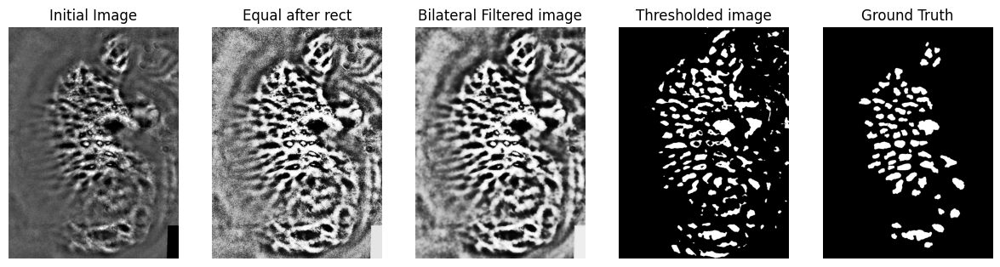

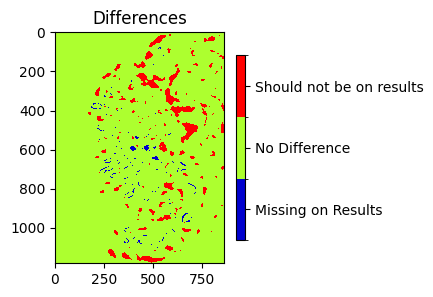

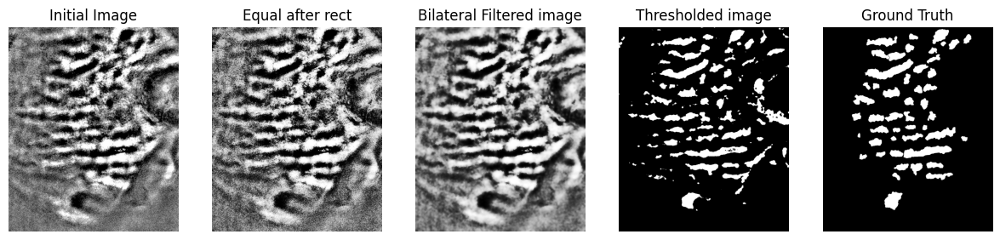

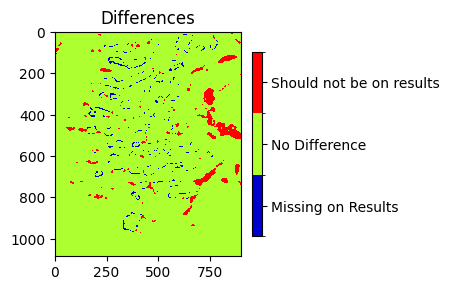

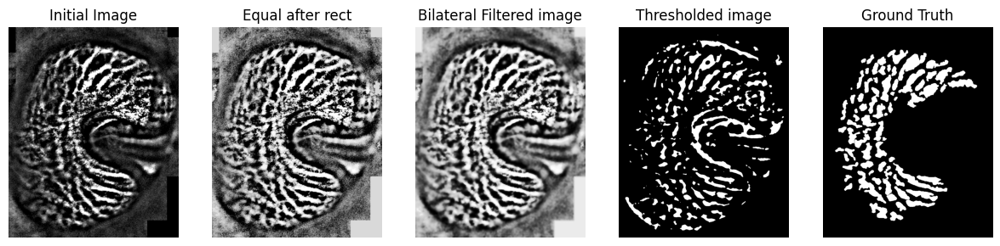

...

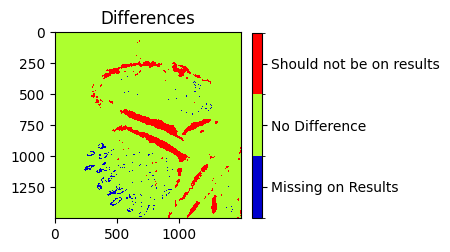

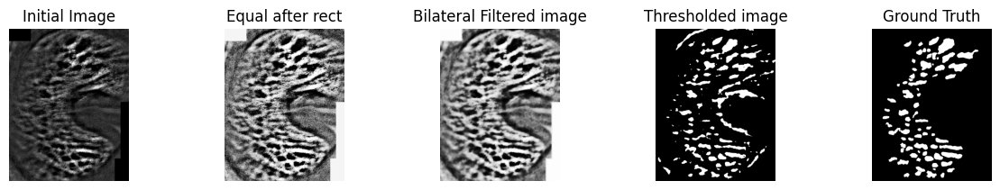

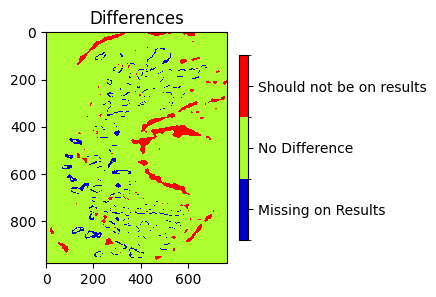

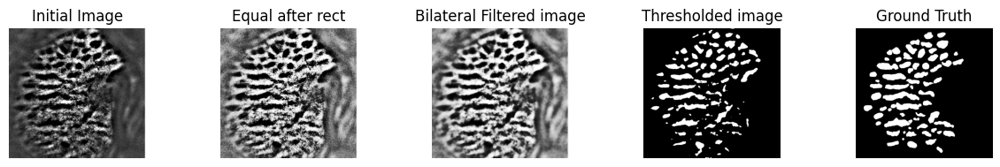

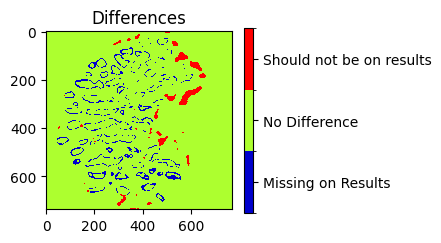

In [ ]:
for image in train_names:
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  im_equalized = exposure.equalize_hist(im_rect_free)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)
  tri_bin_image = triangleThresholding(equal_bilat_im)
  manual_bin_image = np.zeros_like(equal_bilat_im)  # Initialize with zeros (black)
  manual_bin_image[equal_bilat_im < best_thresh ] = 1
  cv2.imwrite(os.path.join(output_dir, f"{image}_manual_thresh_{best_thresh}.png"), img_as_ubyte(manual_bin_image))
  plt.figure(figsize=(18, 18))
  nb_plot = 6
  plot(im, i, nb_plot, 1, "Initial Image")
  plot(im_equalized, i, nb_plot, 2, "Equal after rect")
  plot(equal_bilat_im, i, nb_plot, 3, "Bilateral Filtered image")
  plot(manual_bin_image, i, nb_plot, 4, "Thresholded image")
  plot(mask, i, nb_plot, 5, "Ground Truth")
  plotDifferences(mask, manual_bin_image)
  i+=1
  f1score = validation(manual_bin_image,mask)
  scores["Man_Threshold"]["train"][image] = {"f1score": f1score}

f1scores_train = [result["f1score"] for result in scores["Man_Threshold"]["train"].values()]
scores["Man_Threshold"]["mean_train"] = {"f1score": np.mean(f1scores_train)}
scores["Man_Threshold"]["std_train"] = {"f1score": np.std(f1scores_train)}


for image in test_names:
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  im_equalized = exposure.equalize_hist(im_rect_free)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)
  tri_bin_image = triangleThresholding(equal_bilat_im)
  manual_bin_image = np.zeros_like(equal_bilat_im)  # Initialize with zeros (black)
  manual_bin_image[equal_bilat_im < best_thresh] = 1
  cv2.imwrite(os.path.join(output_dir, f"{image}_manual_thresh_{best_thresh:.2f}.png"), img_as_ubyte(manual_bin_image))

  f1score = validation(manual_bin_image,mask)
  scores["Man_Threshold"]["test"][image] = {"f1score": f1score}
f1scores_test = [result["f1score"] for result in scores["Man_Threshold"]["test"].values()]
scores["Man_Threshold"]["mean_test"] = {"f1score": np.mean(f1scores_test)}
scores["Man_Threshold"]["std_test"] = {"f1score": np.std(f1scores_test)}

## Method 2: Reconstruction by dilation

This method aims to reconstruct the image by retaining only the pores of interest (Regions of Interest, ROI) by removing background noise and clearly defining our markers. The steps involved have been coded bellow and are as follows:

1. Load the Images and Ground Truth Masks: Begin by loading the images and their corresponding ground truth masks for processing. These masks serve as a benchmark for evaluating the performance of the detection method.
2. Replace Black Rectangle Pixel Values: Replace pixel values within black rectangles with a median gray value (128) to ensure these areas do not affect thresholding.
3. Equalize Image Histograms: Perform histogram equalization to normalize contrast across images, enabling uniform application of thresholds or adjustments.
4. Apply Bilateral Filter: Use a bilateral filter to smooth out the pore's edges, enhancing the outline and the distinguishability of the pores.
5. Re-Equalize the Histograms: Reapply histogram equalization to maximize the dynamic range. The resulting image is referred to as the *equalized bilateral image*. From this point, two parallel processes are carried out:
  * Manual Thresholding: Apply a **manual threshold at 0.18** to the *equalized bilateral image* (with pixel values normalized between 0 and 1). This threshold is chosen to detect pores while minimizing noise.
  * Local Minima Detection: Identify local minima in the *equalized bilateral image*.
6. Create Markers: Generate markers by multiplying the manually thresholded image with the local minima image. This step uses the manual threshold as a mask to suppress noise retained by the local minima on the image's far edges.
7. Refine Markers via Erosion: Refine the markers by applying erosion using a **square structuring element (SE) of size 3** to minimize side noise further.
8. Reconstruct the Image by Dilation: Finally, reconstruct the image by dilation using the refined markers.
9. Evaluate F1 Score: The thresholded image is compared against the ground truth mask to compute the F1 score. This metric evaluates the precision and recall of the detected pores, providing a comprehensive measure of accuracy.
10. Calculate and Report Statistics: The mean and standard deviation of F1 scores are calculated for both the training and test datasets. These metrics provide an overall assessment of the method's performance.

In [ ]:
# METHOD 2: Reconstruction by Dilation
scores["Reconstruct_dilation"] = {"train": {}, "test": {}}
manual_threshold = np.linspace(0, 0.3, 30)
max_f1 = 0

for thresh in manual_threshold:
  for image in train_names:
    i=1
    # Load the images and ground truth masks.
    im = loadImage(image)
    mask = loadGroundTruth(image)

    # Delete the rectangles by changing their values
    im_rect_free = deleteRectangles(im)
    # Equalize the histogram
    im_equalized = exposure.equalize_hist(im_rect_free)
    # Apply a bilateral filter
    bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
    # Equalize the histogram
    equal_bilat_im = exposure.equalize_hist(bilat_im)

    # Initialize an image with zeros (black)
    manual_bin_image = np.zeros_like(equal_bilat_im)
    # Apply manual threshold to equal_bilat_im
    manual_bin_image[equal_bilat_im < thresh ] = 1
    # Find the local minima of the equal_bilat_im
    minima = MM.local_minima(equal_bilat_im)
    # Multiplying the manually thresholded image by the minimum image to create the markers
    markers = minima*manual_bin_image
    # Apply an erosion to the markers image
    SE = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    erod = MM.erosion(markers, footprint = SE) # Erosion

    # Reconstruct the image by dilation
    reconstruct_im = MM.reconstruction(erod, manual_bin_image, method='dilation') # Reconstruct

    f1score = validation(reconstruct_im,mask)
    scores["Reconstruct_dilation"]["train"][image] = {"f1score": f1score}

  f1scores_train = [result["f1score"] for result in scores["Reconstruct_dilation"]["train"].values()]
  if np.mean(f1scores_train) >= max_f1:
    max_f1 = np.mean(f1scores_train)
    best_thresh = thresh
print(f"The best f1-score mean {max_f1:.3f} is associated to a manual thresholding of {best_thresh:.3f}")

The best f1-score mean 0.633 is associated to a manual thresholding of 0.155


<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


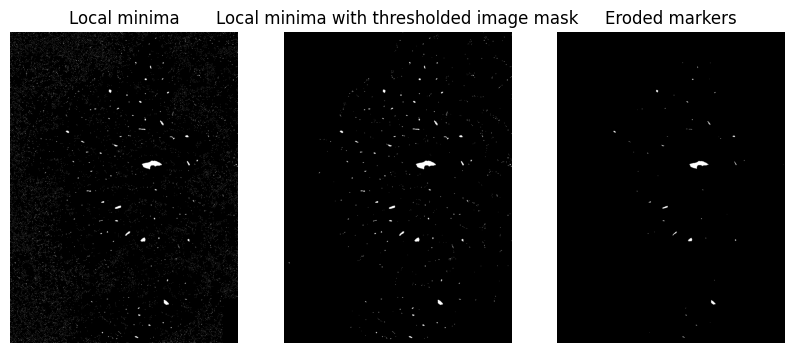

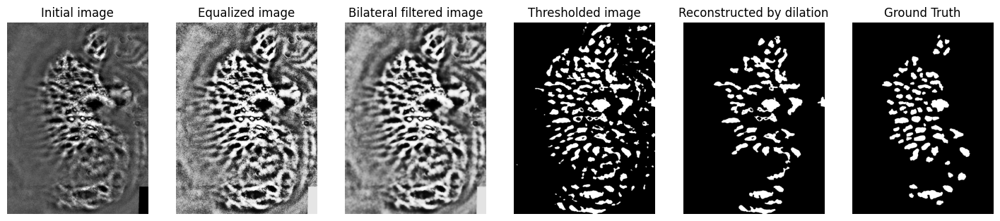

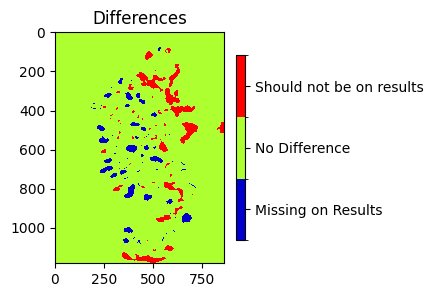

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


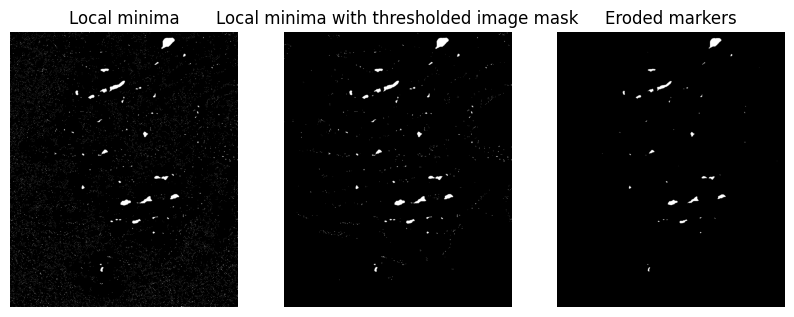

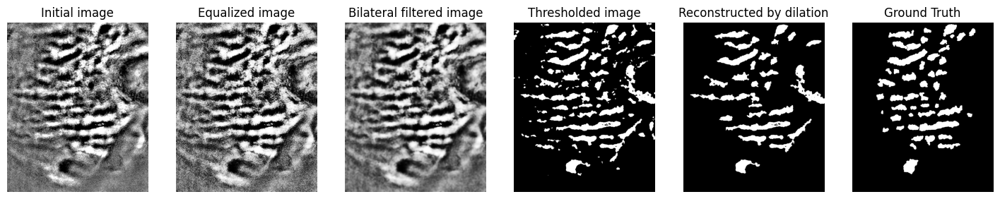

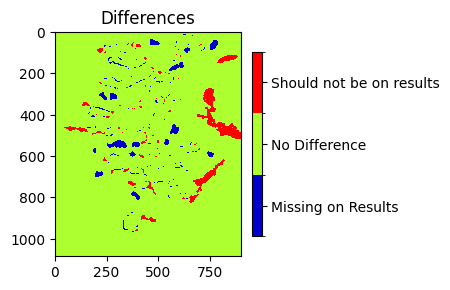

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


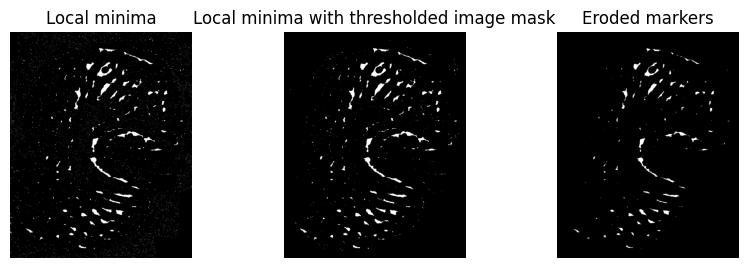

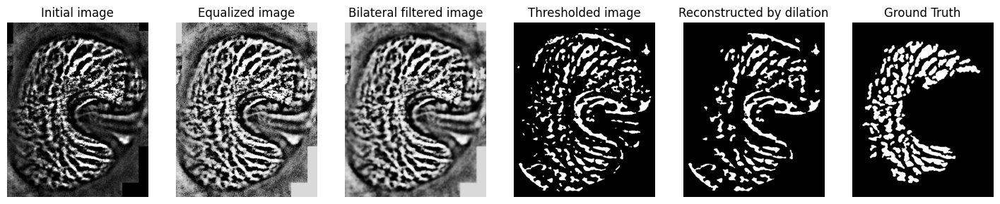

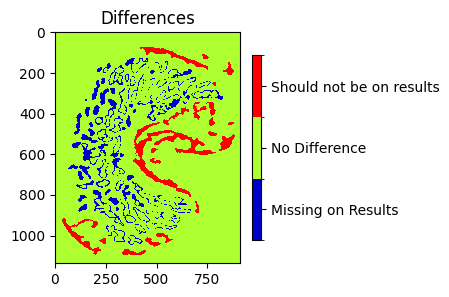

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


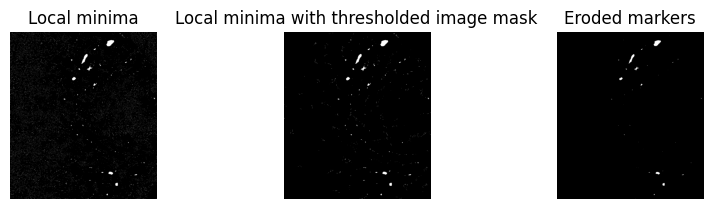

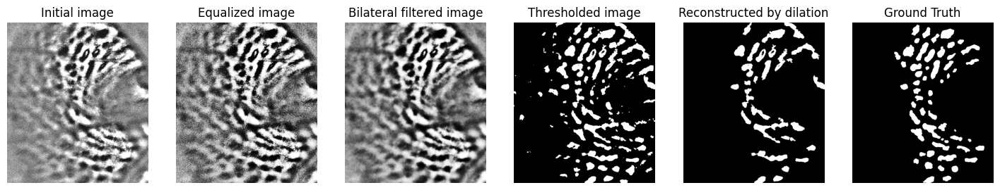

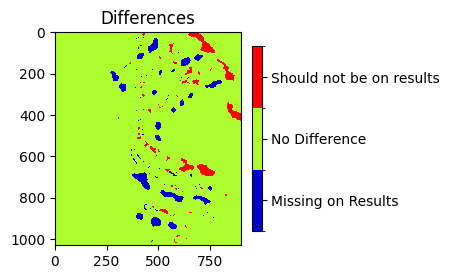

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


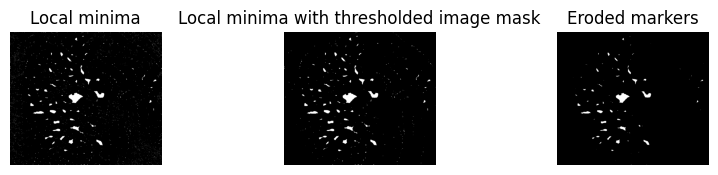

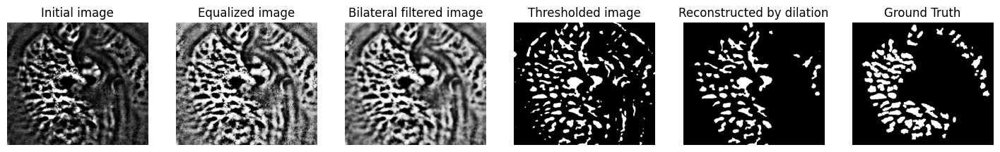

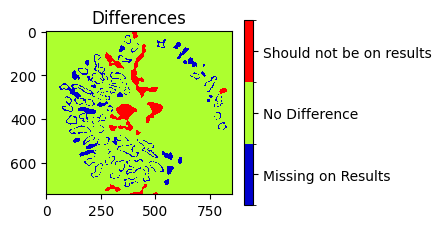

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


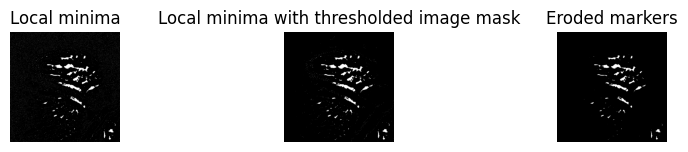

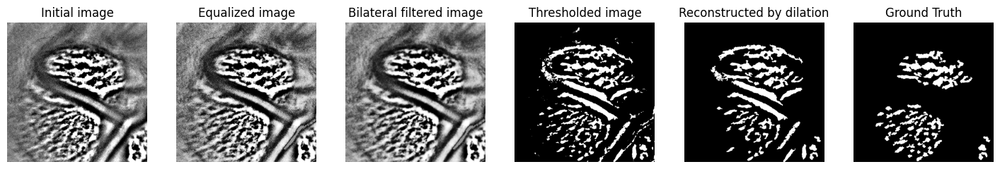

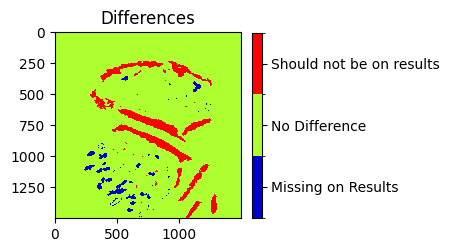

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


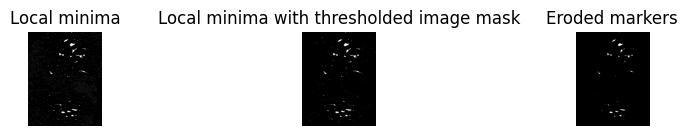

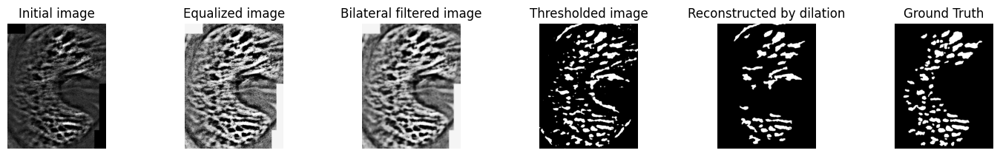

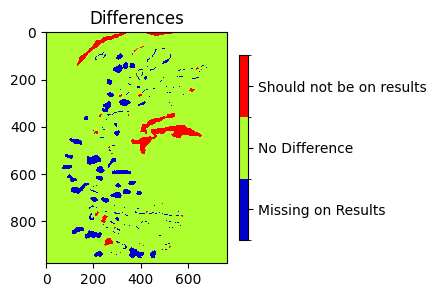

<ipython-input-17-cbe76c91cf3d>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


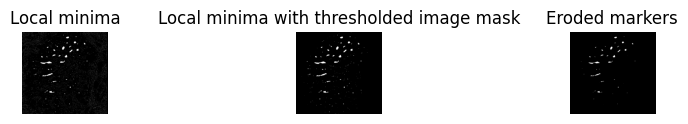

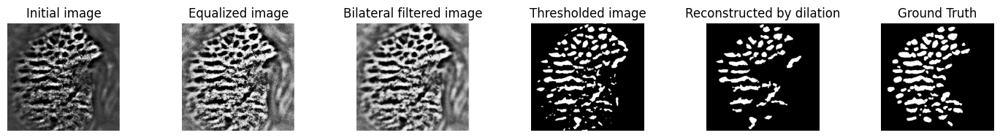

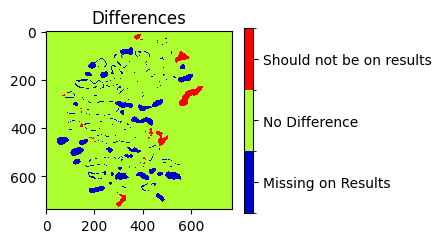

<ipython-input-17-cbe76c91cf3d>:54: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))
<ipython-input-17-cbe76c91cf3d>:54: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  erod = MM.erosion(markers, footprint = MM.square(3))


In [ ]:
for image in train_names:
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  im_equalized = exposure.equalize_hist(im_rect_free)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)
  manual_bin_image = np.zeros_like(equal_bilat_im)
  manual_bin_image[equal_bilat_im < best_thresh ] = 1
  minima = MM.local_minima(equal_bilat_im)
  markers = minima*manual_bin_image
  erod = MM.erosion(markers, footprint = MM.square(3))
  reconstruct_im = MM.reconstruction(erod, manual_bin_image, method='dilation')
  cv2.imwrite(os.path.join(output_dir, f"{image}_reconstruction_{best_thresh:.2f}.png"), img_as_ubyte(reconstruct_im))


  plt.figure(figsize=(10, 10))
  nb_plot = 3
  plot(minima, i, nb_plot, 1, "Local minima")
  plot(markers, i, nb_plot, 2, "Local minima with thresholded image mask")
  plot(erod, i, nb_plot, 3, "Eroded markers")

  plt.figure(figsize=(18, 18))
  nb_plot = 6
  plot(im, i, nb_plot, 1, "Initial image")
  plot(im_equalized, i, nb_plot, 2, "Equalized image")
  plot(bilat_im, i, nb_plot, 3, "Bilateral filtered image")
  plot(manual_bin_image, i, nb_plot, 4, "Thresholded image")
  plot(reconstruct_im, i, nb_plot, 5, "Reconstructed by dilation")
  plot(mask, i, nb_plot, 6, "Ground Truth")

  plotDifferences (mask, reconstruct_im)

  i+=1

  f1score = validation(manual_bin_image,mask)
  scores["Reconstruct_dilation"]["train"][image] = {"f1score": f1score}
f1scores_train = [result["f1score"] for result in scores["Reconstruct_dilation"]["train"].values()]
scores["Reconstruct_dilation"]["mean_train"] = {"f1score": np.mean(f1scores_train)}
scores["Reconstruct_dilation"]["std_train"] = {"f1score": np.std(f1scores_train)}


for image in test_names:
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  im_equalized = exposure.equalize_hist(im_rect_free)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)
  manual_bin_image = np.zeros_like(equal_bilat_im)
  manual_bin_image[equal_bilat_im < best_thresh ] = 1
  minima = MM.local_minima(equal_bilat_im)
  markers = minima*manual_bin_image
  erod = MM.erosion(markers, footprint = MM.square(3))
  reconstruct_im = MM.reconstruction(erod, manual_bin_image, method='dilation')

  f1score = validation(reconstruct_im,mask)
  scores["Reconstruct_dilation"]["test"][image] = {"f1score": f1score}
f1scores_test = [result["f1score"] for result in scores["Reconstruct_dilation"]["test"].values()]
scores["Reconstruct_dilation"]["mean_test"] = {"f1score": np.mean(f1scores_test)}
scores["Reconstruct_dilation"]["std_test"] = {"f1score": np.std(f1scores_test)}

## Method 3: Top Hat

This method employs the morphological Top Hat operation to enhance and isolate the pores (Regions of Interest, ROI) by removing background structures and improving the contrast between the pores and their surroundings. The steps in this method are as follows:


Summary and Description for the Top Hat Method
This method employs the morphological Top Hat operation to enhance and isolate the pores (Regions of Interest, ROI) by removing background structures and improving the contrast between the pores and their surroundings. The steps in this method are as follows:

1. Load the Images and Ground Truth Masks: Begin by loading the images and their corresponding ground truth masks for processing. These masks serve as a benchmark for evaluating the performance of the detection method.
2. Replace Black Rectangle Pixel Values: Replace pixel values within black rectangles with a median gray value (128) to ensure these regions do not interfere with the Top Hat operation.
3. Invert Image Intensities: The gray levels in the image are inverted using a bitwise NOT operation. This inversion makes the dark fetures (pores) appear as bright, which is suitable for the Top Hat operation.
4. Equalize the Histogram:
Perform histogram equalization to normalize the intensity distribution across the image. This step enhances the contrast between the inverted pores and the background
5. Apply Bilateral Filter: Use a bilateral filter to smooth out the pore's edges, enhancing the outline and the distinguishability of the pores.
6. Re-Equalize the Histogram: Reapply histogram equalization to maximize the dynamic range. The resulting image is referred to as the *equalized bilateral image*.
7. Morphological Top Hat Operation: A **rectangular structuring element (SE) of size 59×59** is created. The Top Hat operation is applied using this SE to extract the bright features (pores) from the background. The Top Hat operation highlights regions that are smaller and brighter than the structuring element, effectively isolating the pores.
8. Manual Thresholding: The output of the Top Hat operation is thresholded using a manually defined threshold (**180/255** so about 0.7). Pixels below this threshold are set to 1 (indicating the presence of pores), and others are set to 0 (background).
9. Evaluate F1 Score: The thresholded image is compared against the ground truth mask to compute the F1 score. This metric evaluates the precision and recall of the detected pores, providing a comprehensive measure of accuracy.
10. Calculate and Report Statistics: The mean and standard deviation of F1 scores are calculated for both the training and test datasets. These metrics provide an overall assessment of the method's performance.

In [ ]:
# METHOD 3: TOP HAT
# Find best SE size and threshold
import time
start_time = time.time()  # Record the start time

scores["TopHat"] = {"train": {}, "test": {}}
os.makedirs(output_dir, exist_ok=True)

se_sizes = np.linspace(40, 70, 30, dtype=int)  # Structuring element sizes
manual_thresholds = np.linspace(150/255, 210/255, 12)  # Threshold values

indiv_scores = {image: {} for image in train_names}
best_params = {"se_size": None, "threshold": None, "f1_score": 0}

for image in train_names:
  indiv_scores[image] = {se_size: {} for se_size in se_sizes}

  # Load the images and ground truth masks.
  im = loadImage(image)
  mask = loadGroundTruth(image)
  # Delete the rectangles by changing their values
  im_rect_free = deleteRectangles(im)
  # Invert the gray levels in the image
  im_inverted = cv2.bitwise_not(im_rect_free)
  # Equalize the histogram
  im_equalized = exposure.equalize_hist(im_inverted)
  # Apply a bilateral filter
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  # Equalize the histogram
  equal_bilat_im = exposure.equalize_hist(bilat_im)

  for se_size in se_sizes:
    # Create a Structuring Element
    SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
    # Apply the top hat
    top_hat = cv2.morphologyEx(equal_bilat_im, cv2.MORPH_TOPHAT, SE)

    for thresh in manual_thresholds:
      # Apply manual thresholding
      _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

      f1score = validation(seuil_tophat_im, mask)
      indiv_scores[image][se_size][thresh] = {"f1_score": f1score}

      # Update the best parameters if necessary
      if f1score > best_params["f1_score"]:
          best_params.update({"se_size": se_size, "threshold": thresh, "f1_score": f1score})


# Initialize dictionary to store average F1 scores for each parameter pair
average_f1_scores = {}

# Iterate through parameter combinations and calculate the average F1 score
for se_size in se_sizes:
    for thresh in manual_thresholds:
        # Collect F1 scores for the current parameter combination
        f1_scores_combination = [
            indiv_scores[image][se_size][thresh]["f1_score"]
            for image in indiv_scores
            if se_size in indiv_scores[image] and thresh in indiv_scores[image][se_size]
        ]

        # Calculate the average F1 score for this parameter combination
        if f1_scores_combination:
            average_f1_scores[(se_size, thresh)] = np.mean(f1_scores_combination)

# Find the best parameters based on the highest average F1 score
best_combination = max(average_f1_scores, key=average_f1_scores.get)
best_se_size, best_thresh = best_combination
best_avg_f1_score = average_f1_scores[best_combination]

# Output the best parameters and their average F1 score
print(f"Best Parameters Based on Average F1 Score: \n"
      f"Structuring Element Size = {best_se_size}\n"
      f"Threshold = {best_thresh:.3f}\n "
      f"Average F1 Score = {best_avg_f1_score:.4f}")

end_time = time.time()  # Record the end time

execution_time = end_time - start_time  # Calculate the elapsed time
print(f"Execution Time: {execution_time:.1f} seconds")

Best Parameters Based on Average F1 Score: 
Structuring Element Size = 65
Threshold = 0.717
 Average F1 Score = 0.7495
Execution Time: 428.6 seconds


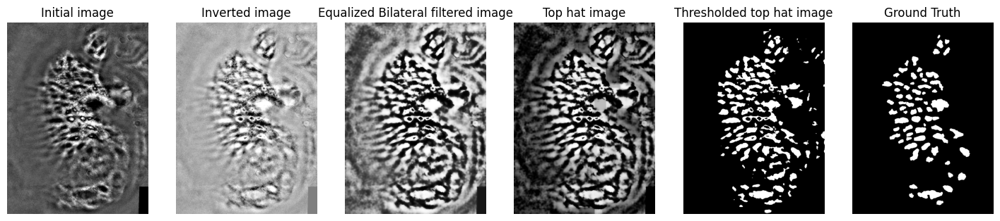

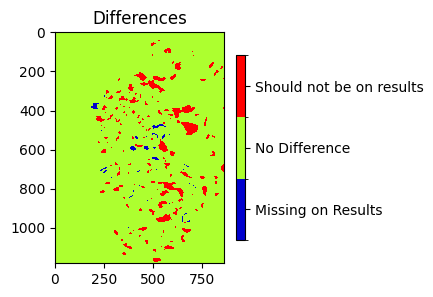

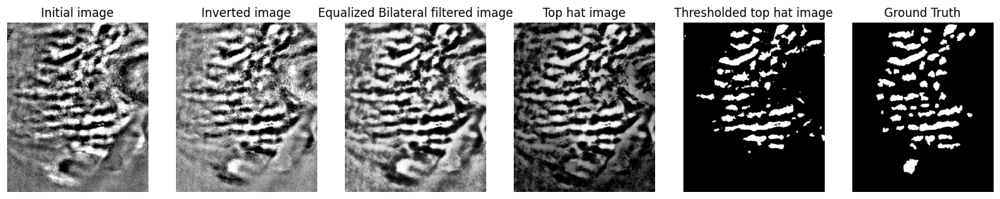

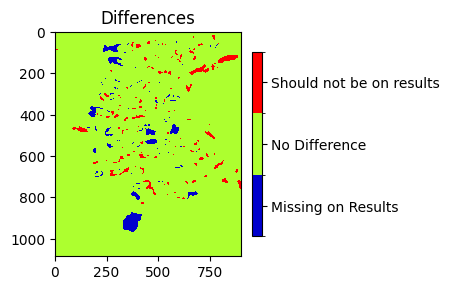

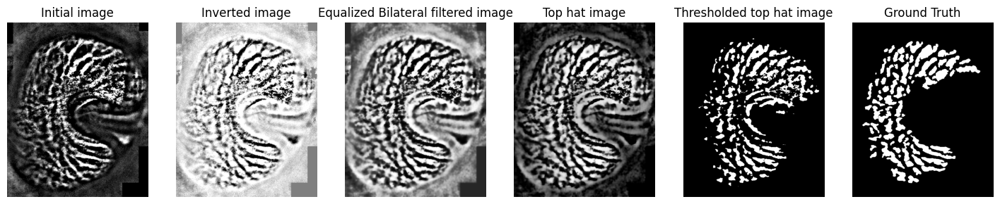

...

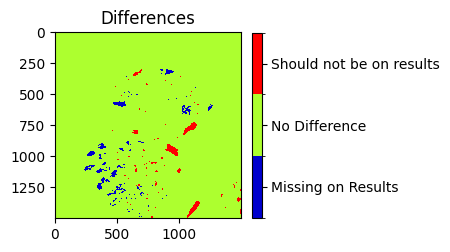

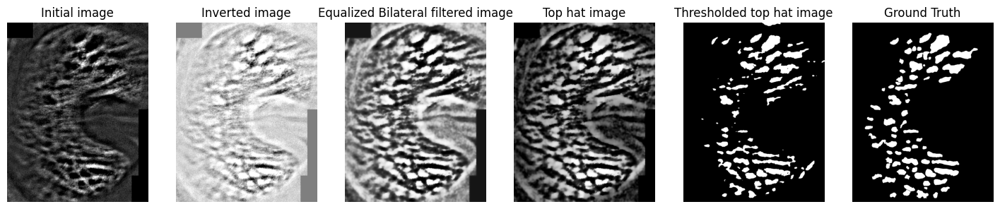

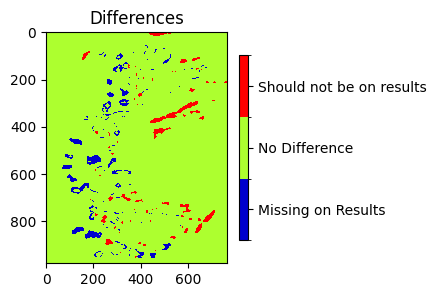

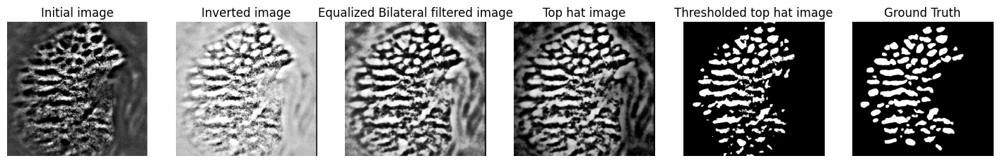

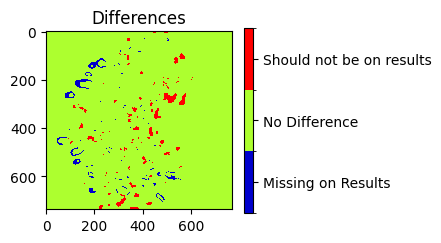

In [ ]:
# METHOD 3: TOP HAT
# Use best SE size and threshold
scores["TopHat"] = {"train": {}, "test": {}}
os.makedirs(output_dir, exist_ok=True)

se_size = best_se_size
thresh = best_thresh

for image in train_names:
  i=1
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  im_inverted = cv2.bitwise_not(im_rect_free)
  im_equalized = exposure.equalize_hist(im_inverted)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)

  SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
  top_hat = cv2.morphologyEx(equal_bilat_im, cv2.MORPH_TOPHAT, SE)
  _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

  plt.figure(figsize=(18, 18))
  nb_plot = 6
  plot(im, i, nb_plot, 1, "Initial image")
  plot(im_inverted, i, nb_plot, 2, "Inverted image")
  plot(equal_bilat_im, i, nb_plot, 3, "Equalized Bilateral filtered image")
  plot(top_hat, i, nb_plot, 4, "Top hat image")
  plot(seuil_tophat_im, i, nb_plot, 5, "Thresholded top hat image")
  plot(mask, i, nb_plot, 6, "Ground Truth")

  plotDifferences (mask, seuil_tophat_im)

  f1score = validation(seuil_tophat_im,mask)
  scores["TopHat"]["train"][image] = {"f1score": f1score}
f1scores_train = [result["f1score"] for result in scores["TopHat"]["train"].values()]
scores["TopHat"]["mean_train"] = {"f1score": np.mean(f1scores_train)}
scores["TopHat"]["std_train"] = {"f1score": np.std(f1scores_train)}

for image in test_names:
  i=1
  im = loadImage(image)
  mask = loadGroundTruth(image)

  im_rect_free = deleteRectangles(im)
  im_inverted = cv2.bitwise_not(im_rect_free)
  im_equalized = exposure.equalize_hist(im_inverted)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_equalized), d=15, sigmaColor=100, sigmaSpace=90)
  equal_bilat_im = exposure.equalize_hist(bilat_im)
  SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
  top_hat = cv2.morphologyEx(equal_bilat_im, cv2.MORPH_TOPHAT, SE)
  _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

  f1score = validation(seuil_tophat_im,mask)
  scores["TopHat"]["test"][image] = {"f1score": f1score}
f1scores_train = [result["f1score"] for result in scores["TopHat"]["test"].values()]
scores["TopHat"]["mean_test"] = {"f1score": np.mean(f1scores_train)}
scores["TopHat"]["std_test"] = {"f1score": np.std(f1scores_train)}

## Method 4: Top Hat 2

In [ ]:
# METHOD 4: TOP HAT
# Find best SE size and threshold
import time
start_time = time.time()  # Record the start time

scores["TopHat2"] = {"train": {}, "test": {}}
os.makedirs(output_dir, exist_ok=True)

se_sizes = np.linspace(40, 70, 30, dtype=int)  # Structuring element sizes
manual_thresholds = np.linspace(150/255, 210/255, 12)  # Threshold values

indiv_scores = {image: {} for image in train_names}
best_params = {"se_size": None, "threshold": None, "f1_score": 0}

for image in train_names:
  indiv_scores[image] = {se_size: {} for se_size in se_sizes}

  # Load the images and ground truth masks.
  im = loadImage(image)
  mask = loadGroundTruth(image)
  # Delete the rectangles by changing their values
  im_rect_free = deleteRectangles(im)
  # Apply a bilateral filter
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_rect_free), d=15, sigmaColor=100, sigmaSpace=90)
  # Equalize the histogram
  im_equalized = exposure.equalize_hist(bilat_im)
  # Invert the gray levels in the image
  im_inverted = 255-im_equalized  #cv2.bitwise_not(im_equalized)

  for se_size in se_sizes:
    # Create a Structuring Element
    SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
    # Apply the top hat
    top_hat = cv2.morphologyEx(im_inverted, cv2.MORPH_TOPHAT, SE)

    for thresh in manual_thresholds:
      # Apply manual thresholding
      _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

      f1score = validation(seuil_tophat_im, mask)
      indiv_scores[image][se_size][thresh] = {"f1_score": f1score}

      # Update the best parameters if necessary
      if f1score > best_params["f1_score"]:
          best_params.update({"se_size": se_size, "threshold": thresh, "f1_score": f1score})


# Initialize dictionary to store average F1 scores for each parameter pair
average_f1_scores = {}

# Iterate through parameter combinations and calculate the average F1 score
for se_size in se_sizes:
    for thresh in manual_thresholds:
        # Collect F1 scores for the current parameter combination
        f1_scores_combination = [
            indiv_scores[image][se_size][thresh]["f1_score"]
            for image in indiv_scores
            if se_size in indiv_scores[image] and thresh in indiv_scores[image][se_size]
        ]

        # Calculate the average F1 score for this parameter combination
        if f1_scores_combination:
            average_f1_scores[(se_size, thresh)] = np.mean(f1_scores_combination)

# Find the best parameters based on the highest average F1 score
best_combination = max(average_f1_scores, key=average_f1_scores.get)
best_se_size, best_thresh = best_combination
best_avg_f1_score = average_f1_scores[best_combination]

# Output the best parameters and their average F1 score
print(f"Best Parameters Based on Average F1 Score: \n"
      f"Structuring Element Size = {best_se_size}\n"
      f"Threshold = {best_thresh:.3f}\n "
      f"Average F1 Score = {best_avg_f1_score:.4f}")

end_time = time.time()  # Record the end time

execution_time = end_time - start_time  # Calculate the elapsed time
print(f"Execution Time: {execution_time:.1f} seconds")

Best Parameters Based on Average F1 Score: 
Structuring Element Size = 70
Threshold = 0.824
 Average F1 Score = 0.1890
Execution Time: 659.8 seconds


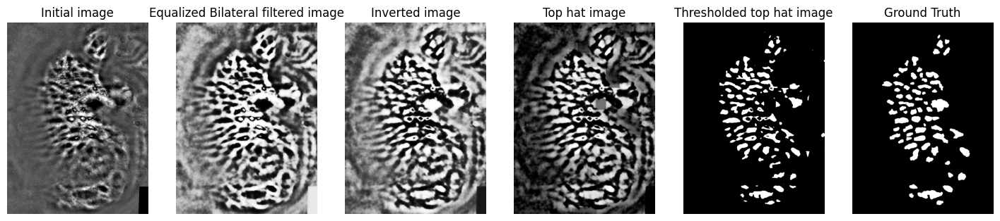

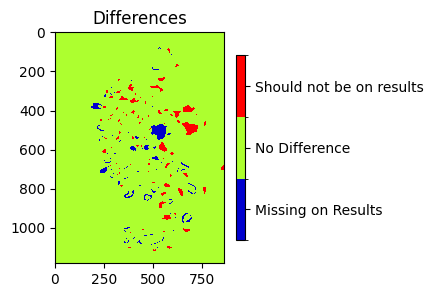

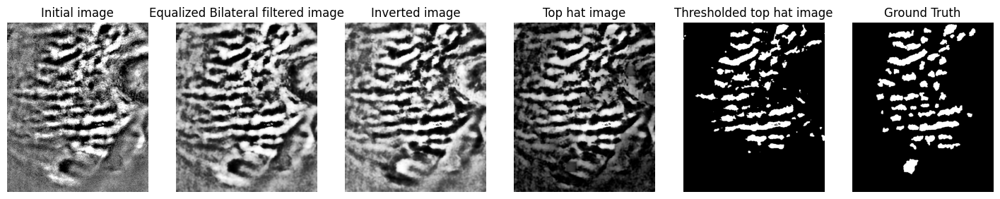

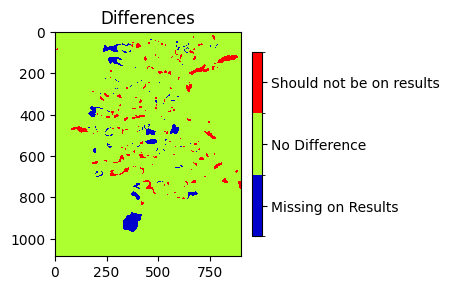

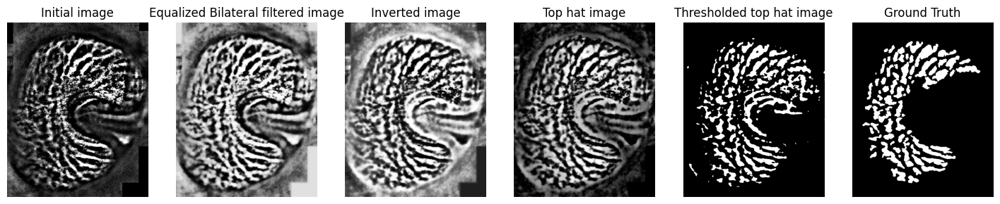

...

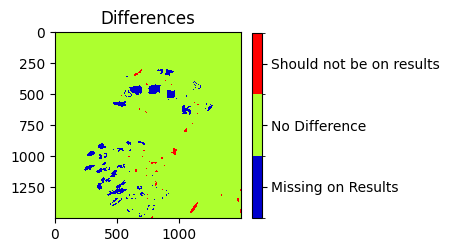

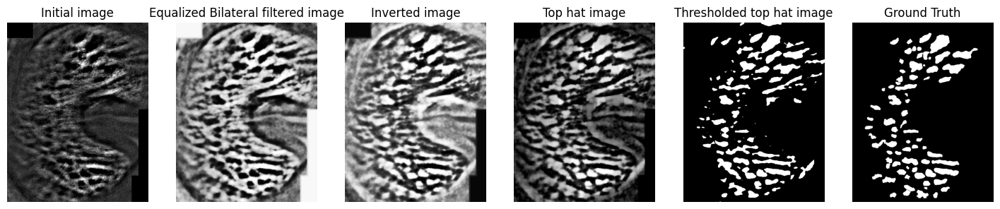

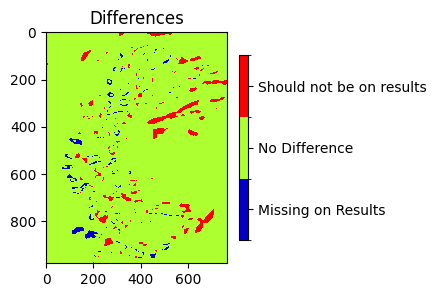

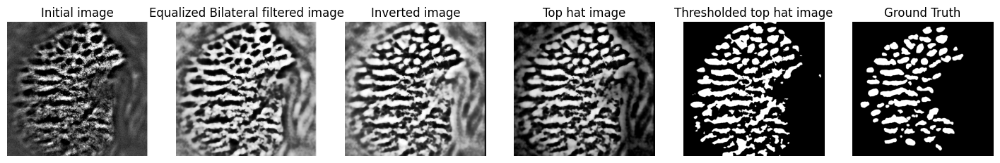

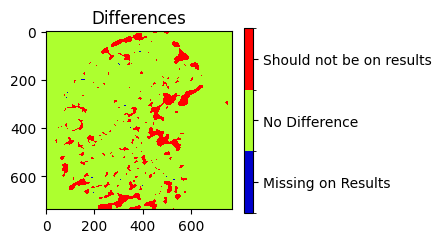

In [ ]:
# METHOD 4: TOP HAT 2

scores["TopHat2"] = {"train": {}, "test": {}}
os.makedirs(output_dir, exist_ok=True)

se_size = 59 #best_se_size
thresh = 180/255#best_thresh

for image in train_names:
  i = 1
  im = loadImage(image)
  mask = loadGroundTruth(image)
  im_rect_free = deleteRectangles(im)
  # bilat_im = cv2.bilateralFilter(img_as_ubyte(im_rect_free), d=15, sigmaColor=100, sigmaSpace=90)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_rect_free),d=15, sigmaColor=100, sigmaSpace=90)
  im_equalized = exposure.equalize_hist(bilat_im)
  im_inverted = 255-im_equalized #cv2.bitwise_not(im_equalized)

  SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
  top_hat = cv2.morphologyEx(im_inverted, cv2.MORPH_TOPHAT, SE)
  _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

  im_binarized = minimumThresholding(top_hat,rate=1)
  if im_binarized.dtype == 'bool':
    im_binarized = (im_binarized*255).astype(np.uint8)
  im_inv_bin = cv2.bitwise_not(im_binarized)

  plt.figure(figsize=(18, 18))
  nb_plot = 6
  plot(im, i, nb_plot, 1, "Initial image")
  plot(im_equalized, i, nb_plot, 2, "Equalized Bilateral filtered image")
  plot(im_inverted, i, nb_plot, 3, "Inverted image")
  plot(top_hat, i, nb_plot, 4, "Top hat image")
  plot(im_inv_bin, i, nb_plot, 5, "Thresholded top hat image")
  plot(mask, i, nb_plot, 6, "Ground Truth")

  plotDifferences (mask, im_inv_bin/255)


  f1score = validation(im_inv_bin,mask)
  scores["TopHat2"]["train"][image] = {"f1score": f1score}

f1scores_train = [result["f1score"] for result in scores["TopHat2"]["train"].values()]
scores["TopHat2"]["mean_train"] = {"f1score": np.mean(f1scores_train)}
scores["TopHat2"]["std_train"] = {"f1score": np.std(f1scores_train)}

for image in test_names:
  i=1
  im = loadImage(image)
  mask = loadGroundTruth(image)

  im_rect_free = deleteRectangles(im)
  bilat_im = cv2.bilateralFilter(img_as_ubyte(im_rect_free), d=15, sigmaColor=100, sigmaSpace=90)
  im_equalized = exposure.equalize_hist(bilat_im)
  im_inverted = cv2.bitwise_not(im_equalized)

  SE = cv2.getStructuringElement(cv2.MORPH_RECT, (se_size, se_size))
  top_hat = cv2.morphologyEx(im_inverted, cv2.MORPH_TOPHAT, SE)
  _, seuil_tophat_im = cv2.threshold(top_hat, thresh, 1, cv2.THRESH_BINARY)

  im_binarized = minimumThresholding(top_hat,rate=1)
  if im_binarized.dtype == 'bool':
    im_binarized = (im_binarized*255).astype(np.uint8)
  im_inv_bin = cv2.bitwise_not(im_binarized)

  f1score = validation(seuil_tophat_im,mask)
  scores["TopHat2"]["test"][image] = {"f1score": f1score}
f1scores_train = [result["f1score"] for result in scores["TopHat2"]["test"].values()]
scores["TopHat2"]["mean_test"] = {"f1score": np.mean(f1scores_train)}
scores["TopHat2"]["std_test"] = {"f1score": np.std(f1scores_train)}


# Conclusion

## Perspectives

# Export Results

In [ ]:
#Combine data in a dataframe and export a csv

import pandas as pd
data = []

for method, method_data in scores.items():
    # Iterate over train and test results
    for phase in ['train', 'test']:
        if phase in method_data:  # Ensure 'train' or 'test' exists
            for image, metrics in method_data[phase].items():
                row = {
                    'Method': method,
                    'Phase': phase,
                    'Image': image,
                    'F1 Score': metrics['f1score'],
                }
                data.append(row)

    # Add the mean and std results
    for stat in ['mean_train', 'std_train', 'mean_test', 'std_test']:
        if stat in method_data:  # Ensure the statistic exists
            row = {
                'Method': method,
                'Phase': stat.split('_')[1],  # Extract 'train' or 'test'
                'Image': stat.split('_')[0],  # 'mean' or 'std'
                'F1 Score': method_data[stat]['f1score'],
            }
            data.append(row)

df = pd.DataFrame(data)
df.to_csv('method1_scores.csv', index=False)
from google.colab import files
# files.download('method1_scores.csv')
df

,Method,Phase,Image,F1 Score
0,Man_Threshold,train,LC001,0.632649
1,Man_Threshold,train,LC002,0.744709
2,Man_Threshold,train,LC003,0.481463
3,Man_Threshold,train,LC004,0.723762
4,Man_Threshold,train,LC005,0.526980
5,Man_Threshold,train,LC006,0.607951
6,Man_Threshold,train,LC007,0.674863
7,Man_Threshold,train,LC008,0.735759
8,Man_Threshold,test,LC009,0.645854
9,Man_Threshold,test,LC010,0.608180


# Export results

In [ ]:
%%capture
# Set paths
notebook_path = "/content/drive/My Drive/Colab Notebooks/Copia de MIA_Project_Moreau_Sanchez-Romero.ipynb"

# Install dependencies
!apt-get install pandoc texlive-xetex texlive-fonts-recommended texlive-latex-extra -qq
!pip install nbconvert -qq

# Convert notebook to PDF
!jupyter nbconvert --to pdf --output "/content/drive/My Drive/Colab Notebooks/MIA_Mini_Project.pdf" "{notebook_path}"

# Download the PDF
from google.colab import files
pdf_path = notebook_path.replace(".ipynb", ".pdf")
if os.path.exists(pdf_path):
    files.download(pdf_path)
else:
    print(f"PDF file not found: {pdf_path}")
